# Training and testing on different distributions

Deep learning algorithms have a huge hunger for training data. They just often work best when you can find enough label training data to put into the training set. This has resulted in many teams sometimes taking whatever data you can find and just shoving it into the training set just to get it more training data. Even if some of this data, or even maybe a lot of this data, doesn't come from the same distribution as your dev and test data. So in a deep learning era, more and more teams are now training on data that comes from a different distribution than your dev and test sets. And there's some subtleties and some best practices for dealing with when you're training and test distributions differ from each other. Let's take a look

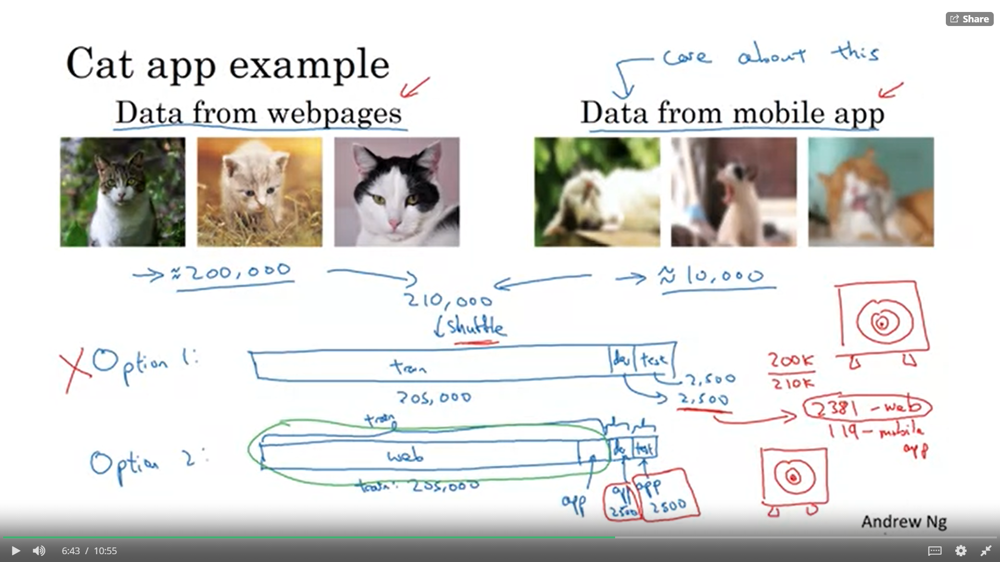

Now so set up your data this way has some advantages but also disadvantages. The advantage is that now you're training, dev and test sets will all come from the same distribution, so that makes it easier to manage. But the disadvantage, and this is a huge disadvantage, is that if you look at your dev set, of these 2,500 examples, a lot of it will come from the web page distribution of images, rather than what you actually care about, which is the mobile app distribution of images.

So the training set will include 200,000 images from the web and 5,000 from the mobile app. The dev set will be 2,500 images from the mobile app, and the test set will be 2,500 images also from the mobile app. The advantage of this way of splitting up your data into train, dev, and test, is that you're now aiming the target where you want it to be. You're telling your team, my dev set has data uploaded from the mobile app and that's the distribution of images you really care about, so let's try to build a machine learning system that does really well on the mobile app distribution of images. The disadvantage, of course, is that now your training distribution is different from your dev and test set distributions. But it turns out that this split of your data into train, dev and test will get you better performance over the long term.

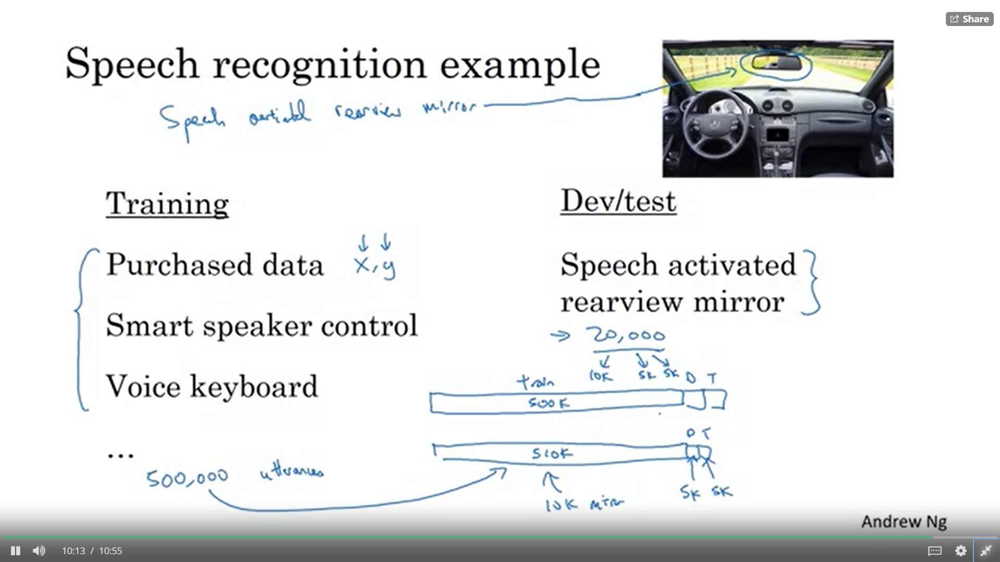

###### Now one question you might ask is, should you always use all the data you have? The answer is subtle, it is not always yes. Let's look at a counter-example in the next video.

# Bias and Variance with mismatched data distributions

Estimating the bias and variance of your learning algorithm really helps you prioritize what to work on next.` But the way you analyze bias and variance changes when your training set comes from a different distribution than your dev and test sets. Let's see how.`

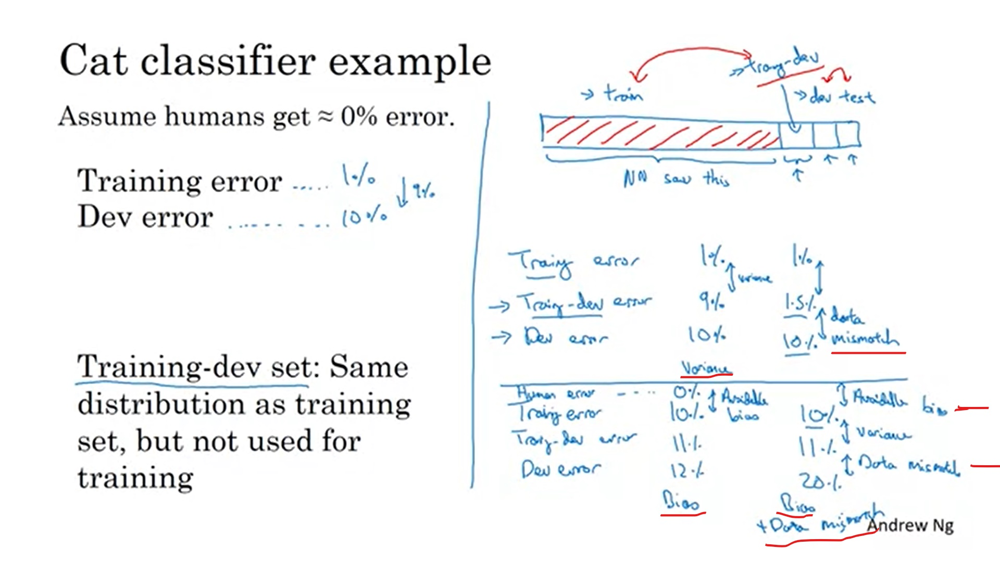

Estimating the bias and variance of your learning algorithm really helps you prioritize what to work on next. But the way you analyze bias and variance changes when your training set comes from a different distribution than your dev and test sets. Let's see how.So maybe there isn't a variance problem and this just reflects that the dev set contains images that are much more difficult to classify accurately.

So the problem with this analysis is that when you went from the training error to the dev error, two things changed at a time. One is that the algorithm saw data in the training set but not in the dev set. Two, the distribution of data in the dev set is different. And because you changed two things at the same time, it's difficult to know of this 9% increase in error, how much of it is because the algorithm didn't see the data in the dev set, so that's some of the variance part of the problem. And how much of it, is because the dev set data is just different

What we're going to do is randomly shuffle the training sets and then carve out just a piece of the training set to be the training-dev set. So just as the dev and test set have the same distribution, the training set and the training-dev set, also have the same distribution.

But, the difference is that now you train your neural network, just on the training set proper. 

`What you can conclude from this is that when you went from training data to training dev data the error really went up a lot. And only the difference between the training data and the training-dev data is that your neural network got to sort the first part of this. It was trained explicitly on this, but it wasn't trained explicitly on the training-dev data. So this tells you that you have a variance problem.`

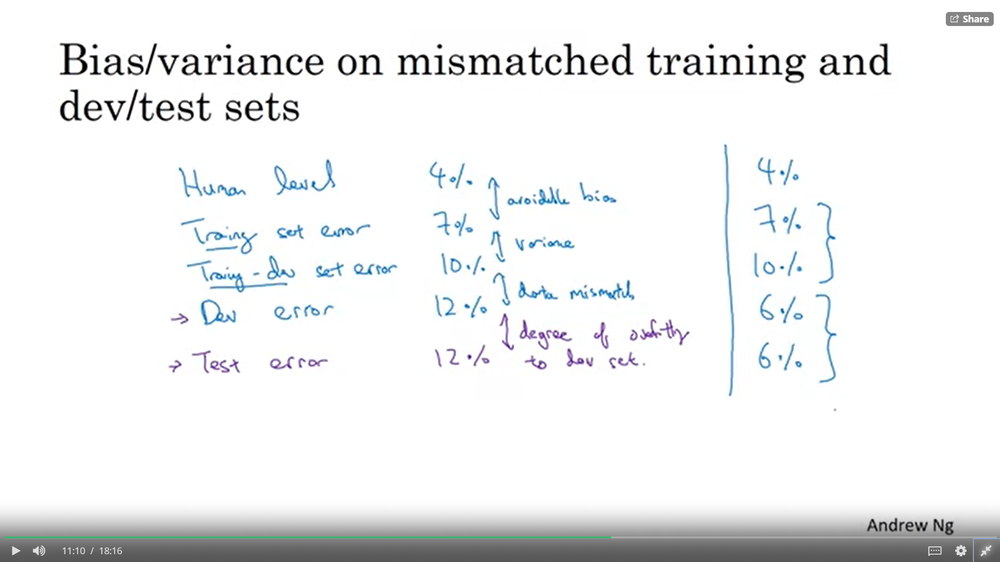

So these two were evaluated on your training set distribution and these two were evaluated on your dev/test set distribution. So sometimes if your dev/test set distribution is much easier for whatever application you're working on then these numbers can actually go down. So if you see funny things like this, there's an even more general formulation of this analysis that might be helpful.

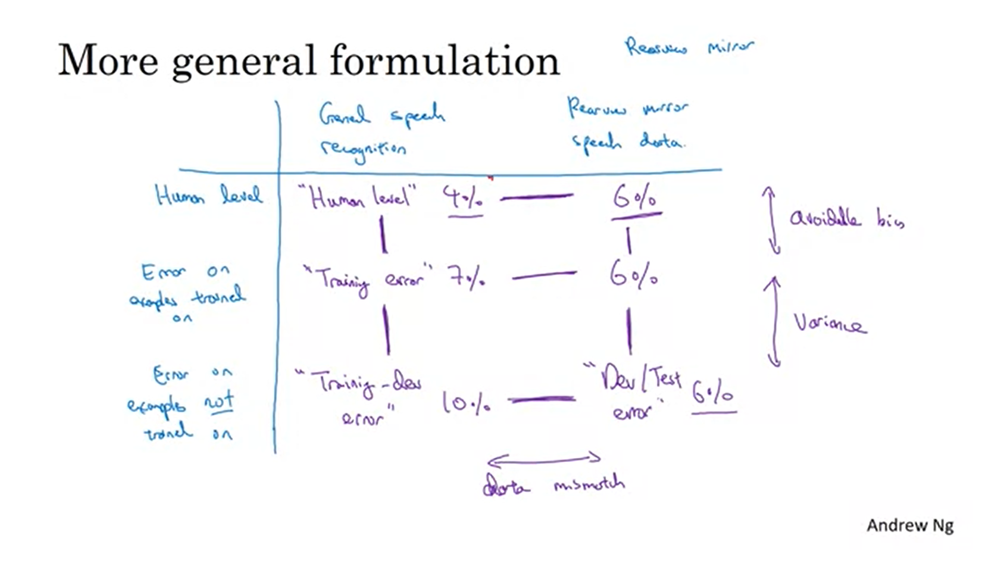

And so if this turns out to be also 6%, and the way you get this number is you ask some humans to label their rearview mirror speech data and just measure how good humans are at this task. And maybe this turns out also to be 6%. And the way you do that is you take some rearview mirror speech data, put it in the training set so the neural network learns on it as well, and then you measure the error on that subset of the data. But if this is what you get, then, well, it turns out that you're actually already performing at the level of humans on this rearview mirror speech data, so maybe you're actually doing quite well on that distribution of data. When you do this more subsequent analysis, it doesn't always give you one clear path forward, but sometimes it just gives you additional insights as well. So for example, comparing these two numbers in this case tells us that for humans, the rearview mirror speech data is actually harder than for general speech recognition, because humans get 6% error, rather than 4% error. But then looking at these differences as well may help you understand bias and variance and data mismatch problems in different degrees. So this more general formulation is something I've used a few times. I've not used it, but for a lot of problems you find that examining this subset of entries, kind of looking at this difference and this difference and this difference, that that's enough to point you in a pretty promising direction. But sometimes filling out this whole table can give you additional insights.

# Addressing data mismatch

If your training set comes from a different distribution, than your dev and test set, and if error analysis shows you that you have a data mismatch problem, what can you do? There are completely systematic solutions to this, but let's look at some things you could try.

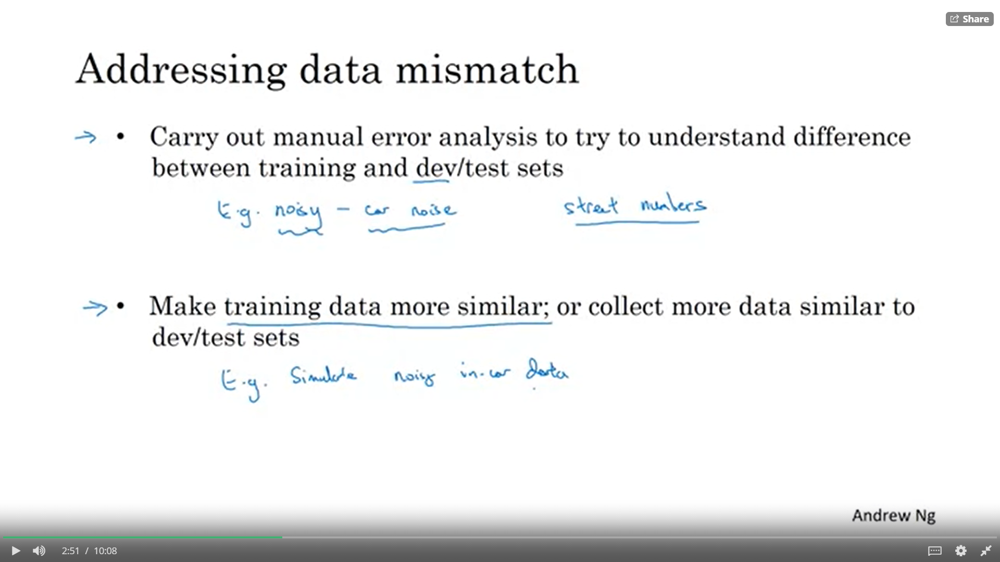

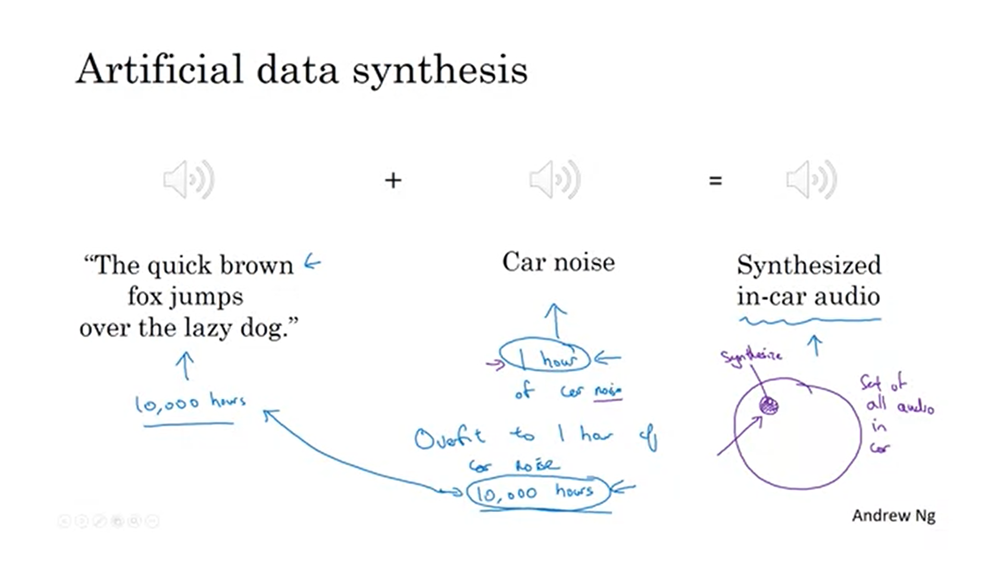

But through artificial data synthesis, you might be able to quickly create more data that sounds like it was recorded inside the car without needing to go out there and collect tons of data, maybe thousands or tens of thousands of hours of data in a car that's actually driving along. So, if your error analysis shows you that you should try to make your data sound more like it was recorded inside the car, then this could be a reasonable process for synthesizing that type of data to give you a learning algorithm

And, let's say, that you have just one hour of car noise. So, one thing you could try is take this one hour of car noise and repeat it 10,000 times in order to add to this 10,000 hours of data recorded against a quiet background. If you do that, the audio will sound perfectly fine to the human ear, but there is a chance, there is a risk that your learning algorithm will over fit to the one hour of car noise. And, in particular, if this is the set of all audio that you could record in the car or, maybe the sets of all car noise backgrounds you can imagine, if you have just one hour of car noise background, you might be simulating just a very small subset of this space. You might be just synthesizing from a very small subset of this space. And to the human ear, all these audio sounds just fine because one hour of car noise sounds just like any other hour of car noise to the human ear. But, it's possible that you're synthesizing data from a very small subset of this space, and the neural network might be overfitting to the one hour of car noise that you may have

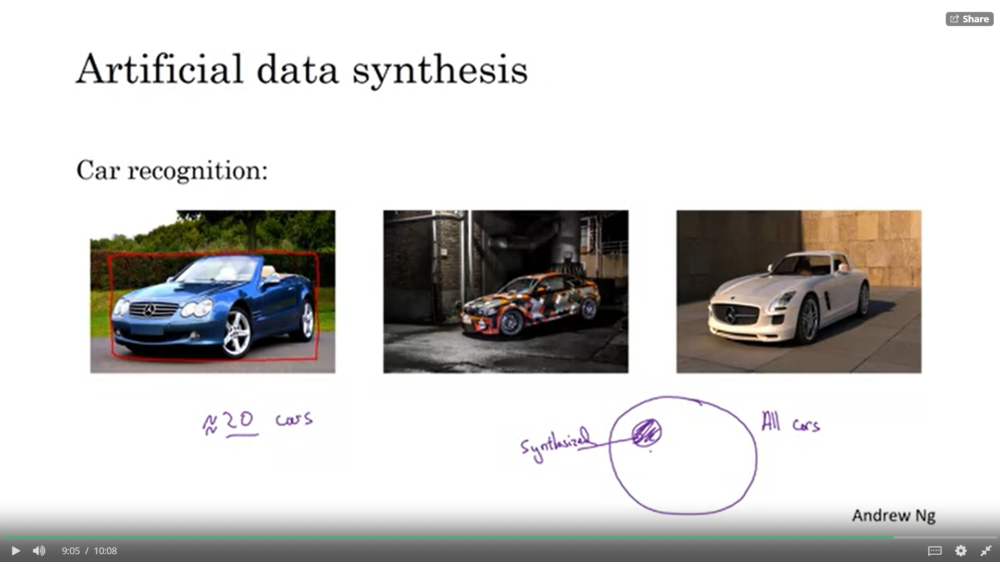